<a href="https://colab.research.google.com/github/mahmoudta74/FIDVR/blob/main/Simulation%20and%20Results.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
from pylab import rcParams
import matplotlib.pyplot as plt
from matplotlib import rc

from torch.utils.tensorboard import SummaryWriter
%load_ext tensorboard
%matplotlib inline
from IPython.display import display, clear_output
import pandas as pd
import time
import json

from sklearn.preprocessing import MinMaxScaler
from pandas.plotting import register_matplotlib_converters
from tqdm.notebook import tqdm

import torch
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader

import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F

import torch.optim as optim

torch.set_printoptions(linewidth=120) #Disply Option for output
torch.set_grad_enabled(True)          # already on by default\


%matplotlib inline
%config InlineBackend.figure_format='retina'

sns.set(style='whitegrid', palette='muted', font_scale=1.2)

HAPPY_COLORS_PALETTE = ["#01BEFE", "#FFDD00", "#FF7D00", "#FF006D", "#93D30C", "#8F00FF"]

sns.set_palette(sns.color_palette(HAPPY_COLORS_PALETTE))

rcParams['figure.figsize'] = 14, 10
register_matplotlib_converters()

RANDOM_SEED = 42
np.random.seed(RANDOM_SEED)
torch.manual_seed(RANDOM_SEED)


font1 = {'family': 'serif',
        'color':  'darkgreen',
        'weight': 'normal',
        'size': 18,
        }


font = {'family': 'serif',
        'color':  'black',
        'weight': 'normal',
        'size': 13,
        }


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
class Network(nn.Module):

    def __init__(self, n_features, n_hidden, n_layers):
        super(Network, self).__init__()

        self.n_features = n_features
        self.n_hidden = n_hidden
        self.n_layers = n_layers

        self.lstm = nn.LSTM(input_size= n_features, hidden_size= n_hidden,
                             num_layers = n_layers, batch_first = True,
                             dropout = 0.4
                             )
            

        self.linear1 = nn.Linear(in_features= n_hidden, out_features= 5)
        self.linear2 = nn.Linear(in_features= 5, out_features= 1)
        #self.linear3 = nn.Linear(in_features= 5, out_features= 1)

    def forward(self, x):

        h0 = torch.randn(self.n_layers, x.size(0), self.n_hidden).to('cuda')  # (batch_size= x.size(0) )
        c0 = torch.randn(self.n_layers, x.size(0), self.n_hidden).to('cuda')
        output, (hn, cn) = self.lstm(x, (h0, c0))
        out = self.linear1(hn[-1])
        out = self.linear2(out)
        #out = self.linear3(out)

        return out

In [ ]:
network = torch.load('/content/drive/MyDrive/FIDVR_model_results/0.1/0.4_5_2048_200_1/model2.ckpt')

## 1st Load shedding

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/dataset/final_sim_1.csv')
data = df.to_numpy()
t = data[:, 0]

In [ ]:
Predictions = []
Rs_JAD = []

for i in range(123+61, 123+61+61, 1):

    Rs_i = data[:, i]
    Rs_JAD.append(Rs_i[15])
    tst_i = torch.tensor(Rs_i[0:18], dtype=torch.float32).reshape(1,18,1).to('cuda')

    preds_i = []
    with torch.no_grad():
    
        pred = network(tst_i)
        preds_i.append(pred.squeeze().item())
        #print(preds)

        for i in range(7):
            tst_i = torch.roll(tst_i, -1, 1)
            tst_i[0,17,0] = pred.squeeze().item()
            #print(tst)
            pred = network(tst_i)
            preds_i.append(pred.squeeze().item())
    
    Predictions.append(preds_i)
        

In [ ]:
Ri = []

for i in range (61):

    Ri.append(0.6*((Predictions[i][-1] - Rs_JAD[i])/0.8) + 0.4*Rs_JAD[i])
Ri = np.array(Ri)

In [ ]:
Load_shedding_bus = np.argmin(Ri)
print(df.columns[123+61+Load_shedding_bus])
Load_shedding_bus

index_fldkhsn3


8

In [ ]:
Ri

array([-0.53429818, -1.0268383 , -0.50431975, -0.60188459, -1.07427027,
        0.16306399, -0.57774554, -0.85637058, -1.48657747, -0.8167919 ,
       -0.13275041, -0.65328746,  0.22175353, -0.45145453, -0.85889773,
       -0.59338988, -0.58366518, -1.05404062,  0.15425863,  0.21100487,
        0.19268019, -0.40224064,  0.02701163, -0.53578677, -0.08340641,
        0.27559605, -0.25627731, -1.07475328, -0.49453894, -0.14761574,
       -0.65051482, -0.77763106, -1.04083959, -0.63810648,  0.15094422,
       -0.89412809, -0.52100167, -0.44645121, -0.99895298, -0.68592669,
       -1.08492528,  0.35404541, -0.71287523, -0.81319765, -0.28262173,
       -0.79782968, -0.92116842, -0.2108195 , -0.06587723, -0.5566911 ,
       -0.29236744, -0.27396398, -0.39900009, -0.37345775, -0.92341446,
        0.19275375,  0.34589751,  0.34562712, -0.89934918, -1.07772003,
       -0.78313007])

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


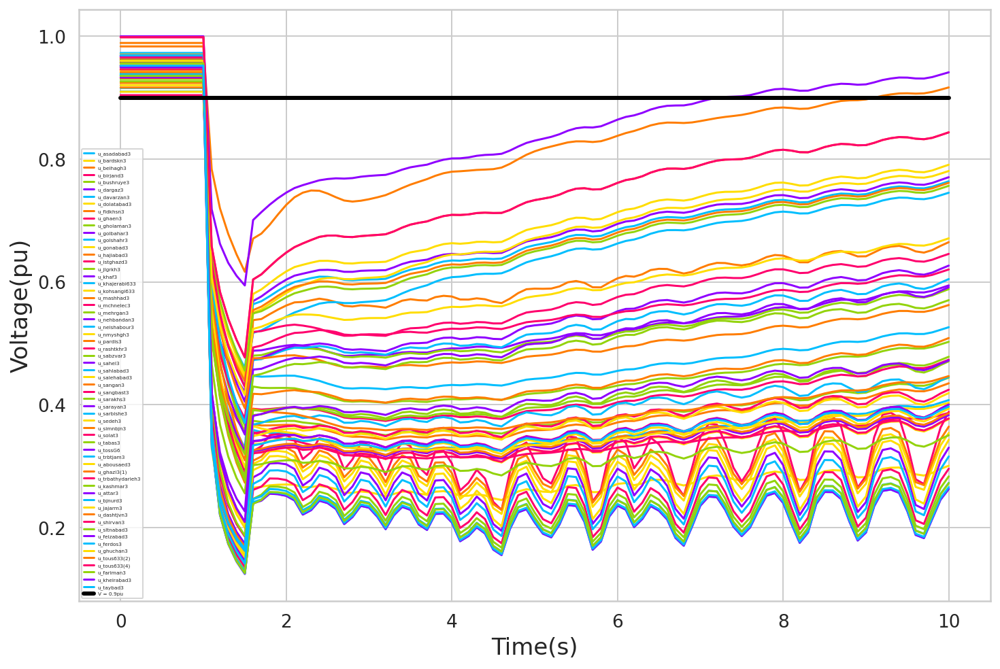

In [ ]:
plt.figure(figsize=(12,8))

for i in range(1, 123+61, 3):
    plt.plot(t[0:101], data[0:101,i], label=df.columns[i] )

'''
plt.annotate('(3.1, 0.9)', xy =(3.1, 0.9),
                xytext =(4, 0.6),  fontsize=15 ,
                arrowprops = dict(facecolor ='black',
                 shrink = 0.05))
'''
plt.plot(t[0:101], 0.9*np.ones((101)), c='black', label='V = 0.9pu', linewidth=3)
#plt.scatter(3.12, 0.9, c='black', s=75)
plt.xlabel('Time(s)', fontsize=17)
plt.ylabel('Voltage(pu)', fontsize=17)
plt.legend(fontsize=3.7)
plt.savefig('unstable_voltage.jpg', format='' ,dpi=400)

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


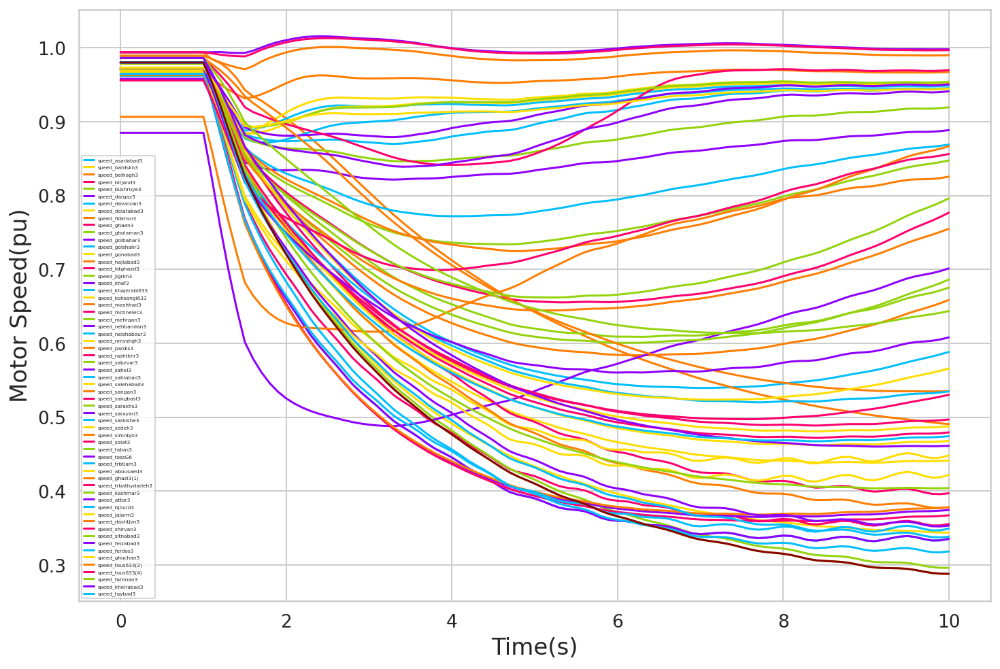

In [ ]:
plt.figure(figsize=(12,8))

for i in range(3, 123+61, 3):
    plt.plot(t[0:101], data[0:101,i], label=df.columns[i])


plt.xlabel('Time(s)', fontsize=17)
plt.ylabel('Motor Speed(pu)', fontsize=17)
plt.plot(t[0:101], data[0:101,123], c='darkred')
plt.legend(fontsize=3.7)
plt.savefig('unstable_speed.eps', format='eps')

## 2nd Load shedding

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/dataset/final_sim_2.csv')
data = df.to_numpy()

In [ ]:
Predictions = []
Rs_JAD = []

for i in range(123+61, 123+61+61, 1):

    Rs_i = data[:, i]
    Rs_JAD.append(Rs_i[17])
    tst_i = torch.tensor(Rs_i[2:20], dtype=torch.float32).reshape(1,18,1).to('cuda')

    preds_i = []
    with torch.no_grad():
    
        pred = network(tst_i)
        preds_i.append(pred.squeeze().item())
        #print(preds)

        for i in range(7):
            tst_i = torch.roll(tst_i, -1, 1)
            tst_i[0,17,0] = pred.squeeze().item()
            #print(tst)
            pred = network(tst_i)
            preds_i.append(pred.squeeze().item())
    
    Predictions.append(preds_i)

In [ ]:
Ri = []

for i in range (61):

    Ri.append(0.6*((Predictions[i][-1] - Rs_JAD[i])/0.8) + 0.4*Rs_JAD[i])
Ri = np.array(Ri)

In [ ]:
Ri

array([-0.54329907, -1.03182992, -0.50082882, -0.60783062, -1.05661553,
        0.12579222, -0.57063977, -0.8695195 ,  1.25404599, -0.82833473,
       -0.14158391, -0.54530668,  0.17902962, -0.47339778, -0.887271  ,
       -0.59225891, -0.59496411, -1.02524333,  0.14415766,  0.18255563,
        0.20611184, -0.38248302,  0.07965991, -0.54083117,  0.05595764,
        0.20108507, -0.16380384, -1.04092968, -0.48635895, -0.00390037,
       -0.66103886, -0.85379242, -1.02592692, -0.4359412 ,  0.17296662,
       -0.87425575, -0.5273911 , -0.4477763 , -0.91439553, -0.7446968 ,
       -1.06853272,  0.36147077, -0.79303155, -0.83506782, -0.29305831,
       -0.81896404, -0.93760331, -0.11188427, -0.06545783, -0.55460016,
       -0.25829821, -0.23291384, -0.37440458, -0.41757481, -0.90359697,
        0.17920168,  0.33959638,  0.38558141, -0.8837964 , -1.15974947,
       -0.84044237])

In [ ]:
Load_shedding_bus = np.argmin(Ri)
print(df.columns[123+61+Load_shedding_bus])
Load_shedding_bus

index_kheirabad3


59

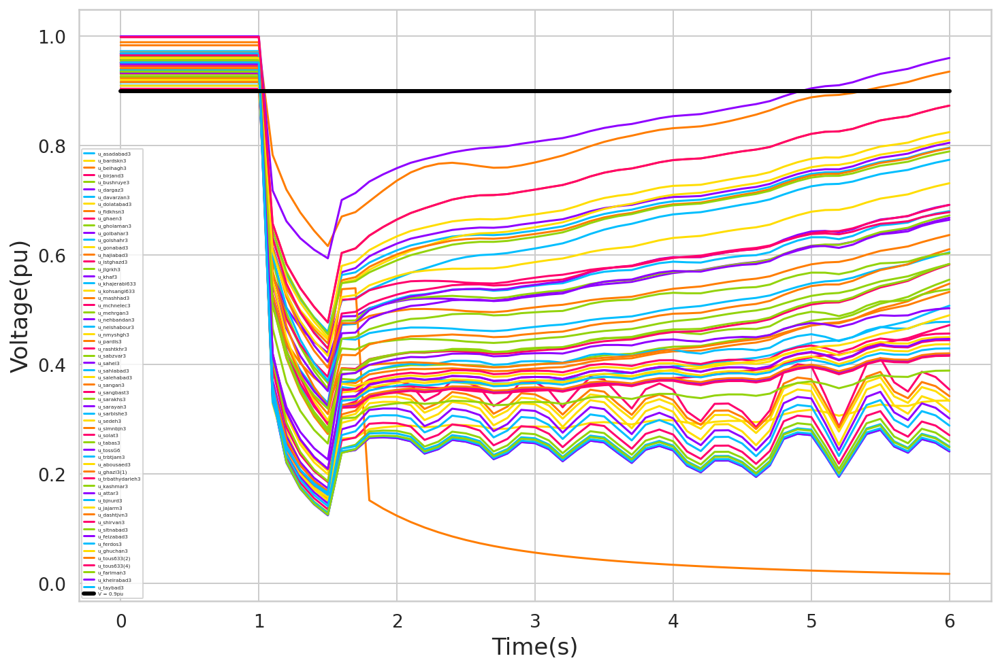

In [ ]:
plt.figure(figsize=(12,8))

for i in range(1, 123+61, 3):
    plt.plot(t[0:61], data[0:61,i], label=df.columns[i] )

'''
plt.annotate('(3.1, 0.9)', xy =(3.1, 0.9),
                xytext =(4, 0.6),  fontsize=15 ,
                arrowprops = dict(facecolor ='black',
                 shrink = 0.05))
'''
plt.plot(t[0:61], 0.9*np.ones((61)), c='black', label='V = 0.9pu', linewidth=3)
#plt.scatter(3.12, 0.9, c='black', s=75)
plt.xlabel('Time(s)', fontsize=17)
plt.ylabel('Voltage(pu)', fontsize=17)
plt.legend(fontsize=3.7)

## 3rd Load shedding 

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/dataset/final_sim_3.csv')
data = df.to_numpy()

In [ ]:
Predictions = []
Rs_JAD = []

for i in range(123+61, 123+61+61, 1):

    Rs_i = data[:, i]
    Rs_JAD.append(Rs_i[19])
    tst_i = torch.tensor(Rs_i[4:22], dtype=torch.float32).reshape(1,18,1).to('cuda')

    preds_i = []
    with torch.no_grad():
    
        pred = network(tst_i)
        preds_i.append(pred.squeeze().item())
        #print(preds)

        for i in range(7):
            tst_i = torch.roll(tst_i, -1, 1)
            tst_i[0,17,0] = pred.squeeze().item()
            #print(tst)
            pred = network(tst_i)
            preds_i.append(pred.squeeze().item())
    
    Predictions.append(preds_i)

In [ ]:
Ri = []

for i in range (61):

    Ri.append(0.6*((Predictions[i][-1] - Rs_JAD[i])/0.8) + 0.4*Rs_JAD[i])
Ri = np.array(Ri)

In [ ]:
Load_shedding_bus = np.argmin(Ri)
print(df.columns[123+61+Load_shedding_bus])
Load_shedding_bus

index_tabas3


40

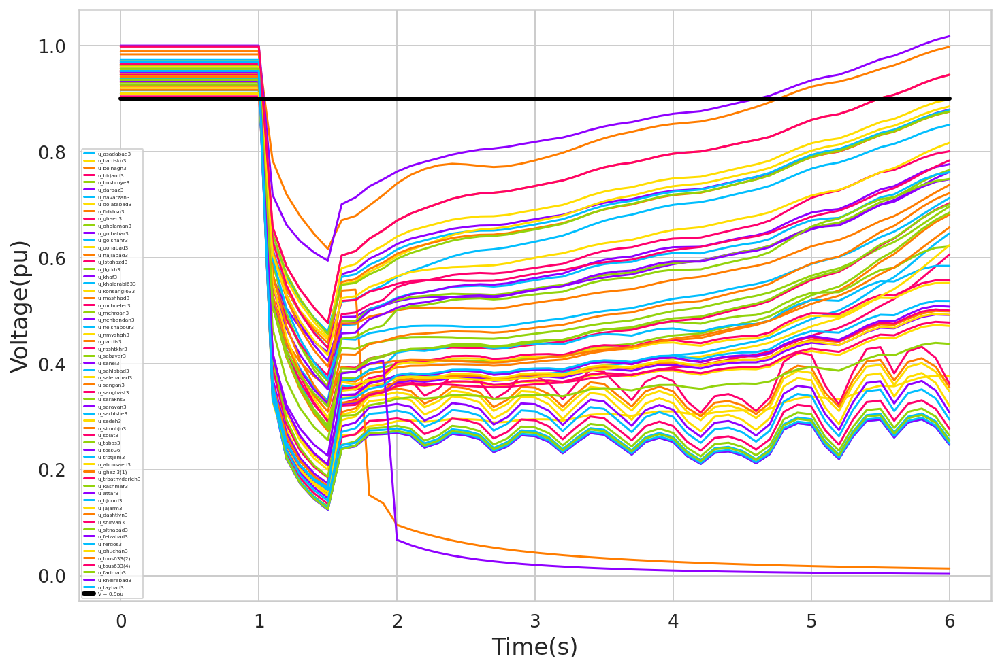

In [ ]:
plt.figure(figsize=(12,8))

for i in range(1, 123+61, 3):
    plt.plot(t[0:61], data[0:61,i], label=df.columns[i] )

'''
plt.annotate('(3.1, 0.9)', xy =(3.1, 0.9),
                xytext =(4, 0.6),  fontsize=15 ,
                arrowprops = dict(facecolor ='black',
                 shrink = 0.05))
'''
plt.plot(t[0:61], 0.9*np.ones((61)), c='black', label='V = 0.9pu', linewidth=3)
#plt.scatter(3.12, 0.9, c='black', s=75)
plt.xlabel('Time(s)', fontsize=17)
plt.ylabel('Voltage(pu)', fontsize=17)
plt.legend(fontsize=3.7)

## 4th Load shedding

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/dataset/final_sim_4.csv')
data = df.to_numpy()

In [ ]:
Predictions = []
Rs_JAD = []

for i in range(123+61, 123+61+61, 1):

    Rs_i = data[:, i]
    Rs_JAD.append(Rs_i[21])
    tst_i = torch.tensor(Rs_i[6:24], dtype=torch.float32).reshape(1,18,1).to('cuda')

    preds_i = []
    with torch.no_grad():
    
        pred = network(tst_i)
        preds_i.append(pred.squeeze().item())
        #print(preds)

        for i in range(7):
            tst_i = torch.roll(tst_i, -1, 1)
            tst_i[0,17,0] = pred.squeeze().item()
            #print(tst)
            pred = network(tst_i)
            preds_i.append(pred.squeeze().item())
    
    Predictions.append(preds_i)

In [ ]:
Ri = []

for i in range (61):

    Ri.append(0.6*((Predictions[i][-1] - Rs_JAD[i])/0.8) + 0.4*Rs_JAD[i])
Ri = np.array(Ri)

In [ ]:
Load_shedding_bus = np.argmin(Ri)
print(df.columns[123+61+Load_shedding_bus])
Load_shedding_bus

index_bardskn3


1

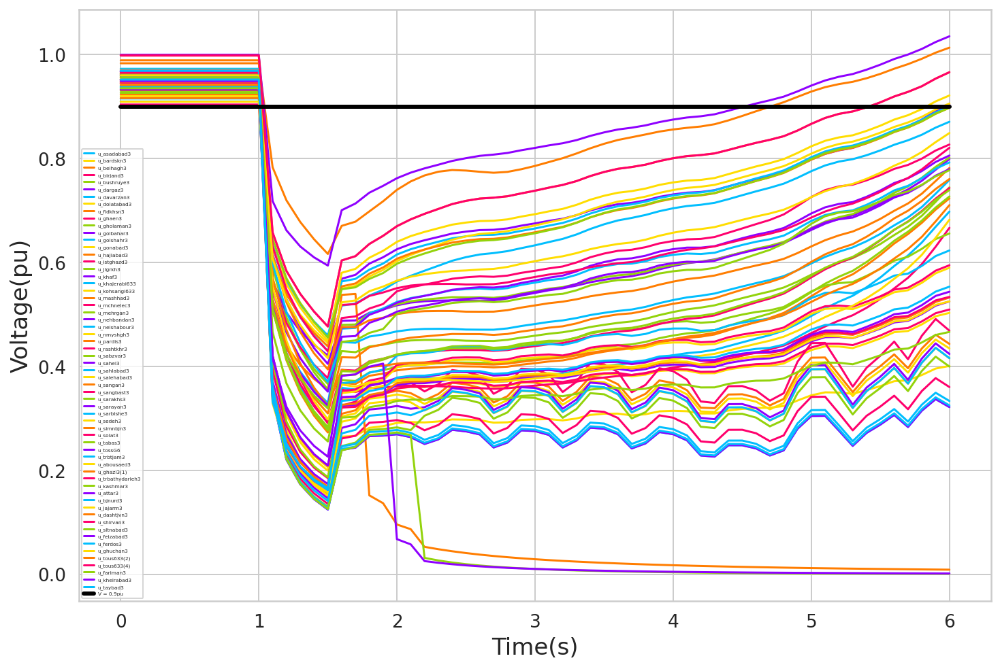

In [ ]:
plt.figure(figsize=(12,8))

for i in range(1, 123+61, 3):
    plt.plot(t[0:61], data[0:61,i], label=df.columns[i] )

'''
plt.annotate('(3.1, 0.9)', xy =(3.1, 0.9),
                xytext =(4, 0.6),  fontsize=15 ,
                arrowprops = dict(facecolor ='black',
                 shrink = 0.05))
'''
plt.plot(t[0:61], 0.9*np.ones((61)), c='black', label='V = 0.9pu', linewidth=3)
#plt.scatter(3.12, 0.9, c='black', s=75)
plt.xlabel('Time(s)', fontsize=17)
plt.ylabel('Voltage(pu)', fontsize=17)
plt.legend(fontsize=3.7)

## 5th Load shedding

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/dataset/final_sim_5.csv')
data = df.to_numpy()

In [ ]:
Predictions = []
Rs_JAD = []

for i in range(123+61, 123+61+61, 1):

    Rs_i = data[:, i]
    Rs_JAD.append(Rs_i[23])
    tst_i = torch.tensor(Rs_i[8:26], dtype=torch.float32).reshape(1,18,1).to('cuda')

    preds_i = []
    with torch.no_grad():
    
        pred = network(tst_i)
        preds_i.append(pred.squeeze().item())
        #print(preds)

        for i in range(7):
            tst_i = torch.roll(tst_i, -1, 1)
            tst_i[0,17,0] = pred.squeeze().item()
            #print(tst)
            pred = network(tst_i)
            preds_i.append(pred.squeeze().item())
    
    Predictions.append(preds_i)

In [ ]:
Ri = []

for i in range (61):

    Ri.append(0.6*((Predictions[i][-1] - Rs_JAD[i])/0.8) + 0.4*Rs_JAD[i])
Ri = np.array(Ri)

In [ ]:
Ri

array([-0.51153746,  1.09173249, -0.36951097, -0.57591926, -0.94285039,
        0.08949959, -0.47474831, -0.73104494,  1.49279276, -0.79163055,
       -0.07480922, -0.23891359,  0.14802412, -0.43283385, -0.8531362 ,
       -0.50956806, -0.32239555, -0.9278667 ,  0.15987191,  0.15697777,
        0.15558631, -0.215785  ,  0.11867468, -0.51186657,  0.25905234,
        0.14962232,  0.04878927, -0.92717983, -0.34011264,  0.25105961,
       -0.63824802, -0.72621144, -0.92487342,  0.34353734,  0.1673904 ,
       -0.77924145, -0.50650424, -0.40863013, -0.89418998, -0.59455911,
        0.32914398,  0.31559696, -0.62584851, -0.67612753, -0.20472017,
       -0.64841492, -0.64397763,  0.25972939, -0.01861704, -0.46622929,
       -0.05035193, -0.08051251, -0.19634584, -0.18033353, -0.79525865,
        0.12495466,  0.30591249,  0.35970291, -0.56288456, -0.81532648,
       -0.70720773])

In [ ]:
Load_shedding_bus = np.argmin(Ri)
print(df.columns[123+61+Load_shedding_bus])
Load_shedding_bus

index_bushruye3


4

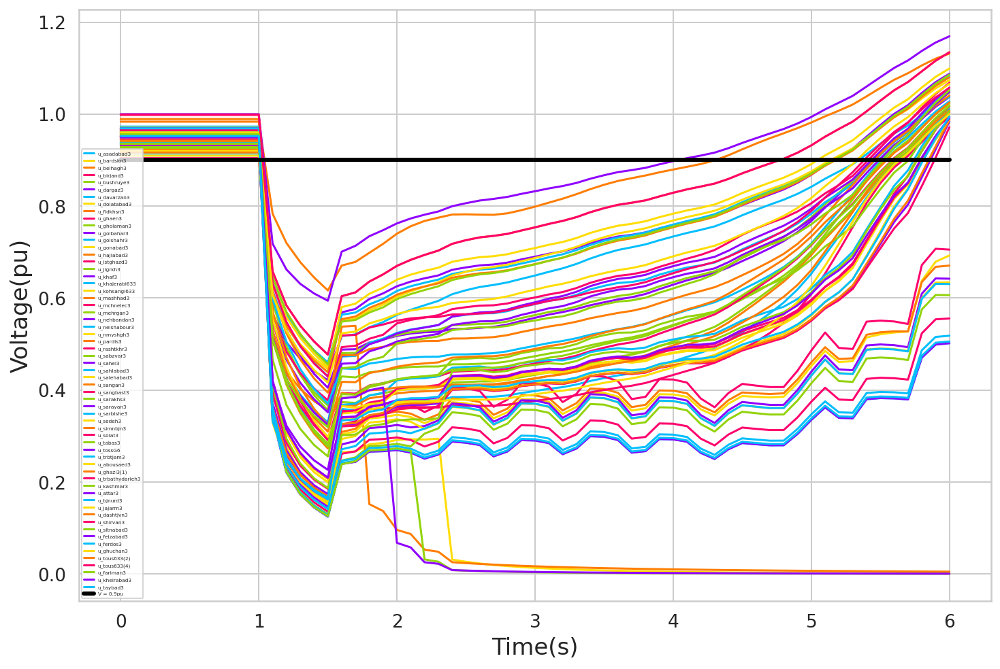

In [ ]:
plt.figure(figsize=(12,8))

for i in range(1, 123+61, 3):
    plt.plot(t[0:61], data[0:61,i], label=df.columns[i] )

'''
plt.annotate('(3.1, 0.9)', xy =(3.1, 0.9),
                xytext =(4, 0.6),  fontsize=15 ,
                arrowprops = dict(facecolor ='black',
                 shrink = 0.05))
'''
plt.plot(t[0:61], 0.9*np.ones((61)), c='black', label='V = 0.9pu', linewidth=3)
#plt.scatter(3.12, 0.9, c='black', s=75)
plt.xlabel('Time(s)', fontsize=17)
plt.ylabel('Voltage(pu)', fontsize=17)
plt.legend(fontsize=3.7)

## 6th Load shedding

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/dataset/final_sim_6.csv')
data = df.to_numpy()
t = data[:, 0]

In [ ]:
Predictions = []
Rs_JAD = []

for i in range(123+61, 123+61+61, 1):

    Rs_i = data[:, i]
    Rs_JAD.append(Rs_i[25])
    tst_i = torch.tensor(Rs_i[10:28], dtype=torch.float32).reshape(1,18,1).to('cuda')

    preds_i = []
    with torch.no_grad():
    
        pred = network(tst_i)
        preds_i.append(pred.squeeze().item())
        #print(preds)

        for i in range(7):
            tst_i = torch.roll(tst_i, -1, 1)
            tst_i[0,17,0] = pred.squeeze().item()
            #print(tst)
            pred = network(tst_i)
            preds_i.append(pred.squeeze().item())
    
    Predictions.append(preds_i)

In [ ]:
Ri = []

for i in range (61):

    Ri.append(0.6*((Predictions[i][-1] - Rs_JAD[i])/0.8) + 0.4*Rs_JAD[i])
Ri = np.array(Ri)

In [ ]:
Load_shedding_bus = np.argmin(Ri)
print(df.columns[123+61+Load_shedding_bus])
Load_shedding_bus

index_bushruye3


4

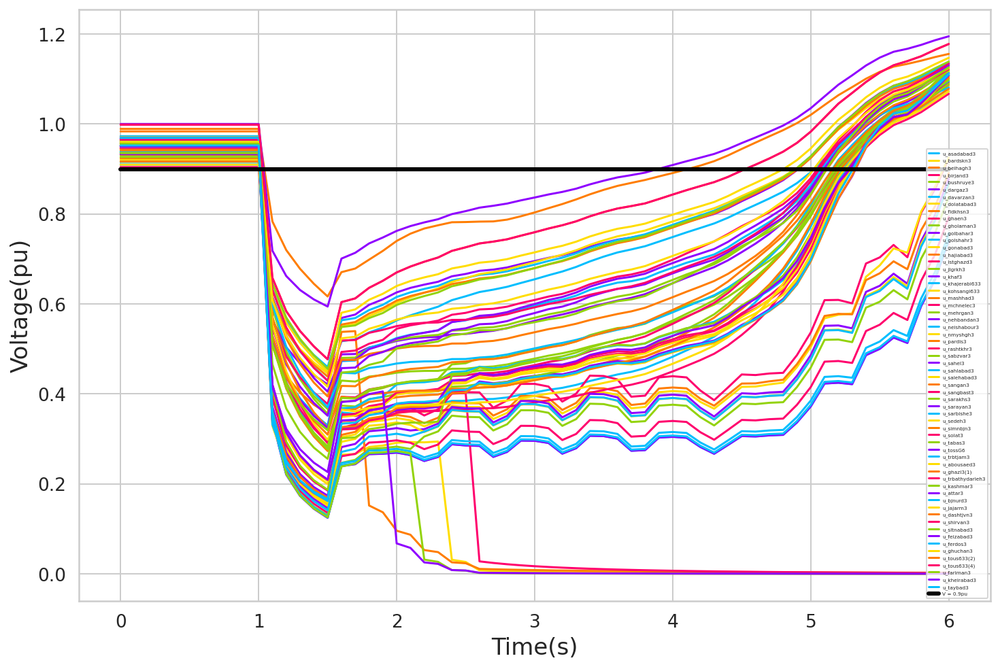

In [ ]:
plt.figure(figsize=(12,8))

for i in range(1, 123+61, 3):
    plt.plot(t[0:61], data[0:61,i], label=df.columns[i] )

'''
plt.annotate('(3.1, 0.9)', xy =(3.1, 0.9),
                xytext =(4, 0.6),  fontsize=15 ,
                arrowprops = dict(facecolor ='black',
                 shrink = 0.05))
'''
plt.plot(t[0:61], 0.9*np.ones((61)), c='black', label='V = 0.9pu', linewidth=3)
#plt.scatter(3.12, 0.9, c='black', s=75)
plt.xlabel('Time(s)', fontsize=17)
plt.ylabel('Voltage(pu)', fontsize=17)
plt.legend(fontsize=3.7)

## 7th Load shedding

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/dataset/final_sim_7.csv')
data = df.to_numpy()
t = data[:, 0]

In [ ]:
Predictions = []
Rs_JAD = []

for i in range(123+61, 123+61+61, 1):

    Rs_i = data[:, i]
    Rs_JAD.append(Rs_i[27])
    tst_i = torch.tensor(Rs_i[12:30], dtype=torch.float32).reshape(1,18,1).to('cuda')

    preds_i = []
    with torch.no_grad():
    
        pred = network(tst_i)
        preds_i.append(pred.squeeze().item())
        #print(preds)

        for i in range(7):
            tst_i = torch.roll(tst_i, -1, 1)
            tst_i[0,17,0] = pred.squeeze().item()
            #print(tst)
            pred = network(tst_i)
            preds_i.append(pred.squeeze().item())
    
    Predictions.append(preds_i)

In [ ]:
Ri = []

for i in range (61):

    Ri.append(0.6*((Predictions[i][-1] - Rs_JAD[i])/0.8) + 0.4*Rs_JAD[i])
Ri = np.array(Ri)

In [ ]:
Load_shedding_bus = np.argmin(Ri)
print(df.columns[123+61+Load_shedding_bus])
Load_shedding_bus

index_simnbjn3


38

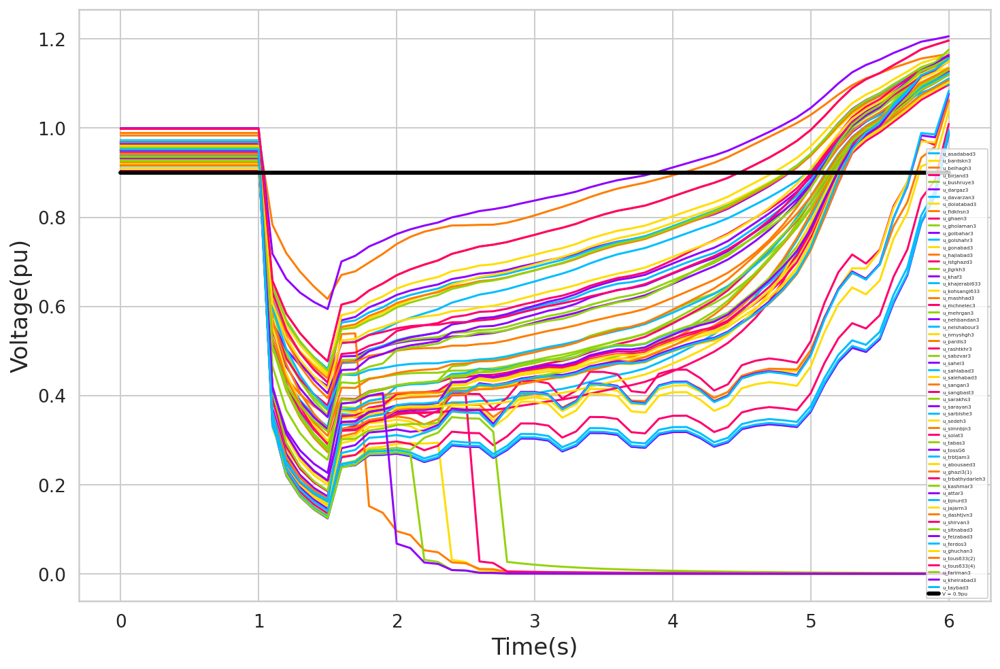

In [ ]:
plt.figure(figsize=(12,8))

for i in range(1, 123+61, 3):
    plt.plot(t[0:61], data[0:61,i], label=df.columns[i] )

'''
plt.annotate('(3.1, 0.9)', xy =(3.1, 0.9),
                xytext =(4, 0.6),  fontsize=15 ,
                arrowprops = dict(facecolor ='black',
                 shrink = 0.05))
'''
plt.plot(t[0:61], 0.9*np.ones((61)), c='black', label='V = 0.9pu', linewidth=3)
#plt.scatter(3.12, 0.9, c='black', s=75)
plt.xlabel('Time(s)', fontsize=17)
plt.ylabel('Voltage(pu)', fontsize=17)
plt.legend(fontsize=3.7)

## 8th Load shedding

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/dataset/final_sim_8.csv')
data = df.to_numpy()
t = data[:, 0]

In [ ]:
Predictions = []
Rs_JAD = []

for i in range(123+61, 123+61+61, 1):

    Rs_i = data[:, i]
    Rs_JAD.append(Rs_i[29])
    tst_i = torch.tensor(Rs_i[14:32], dtype=torch.float32).reshape(1,18,1).to('cuda')

    preds_i = []
    with torch.no_grad():
    
        pred = network(tst_i)
        preds_i.append(pred.squeeze().item())
        #print(preds)

        for i in range(7):
            tst_i = torch.roll(tst_i, -1, 1)
            tst_i[0,17,0] = pred.squeeze().item()
            #print(tst)
            pred = network(tst_i)
            preds_i.append(pred.squeeze().item())
    
    Predictions.append(preds_i)

In [ ]:
Ri = []

for i in range (61):

    Ri.append(0.6*((Predictions[i][-1] - Rs_JAD[i])/0.8) + 0.4*Rs_JAD[i])
Ri = np.array(Ri)

In [ ]:
Load_shedding_bus = np.argmin(Ri)
print(df.columns[123+61+Load_shedding_bus])
Load_shedding_bus

index_sangan3


32

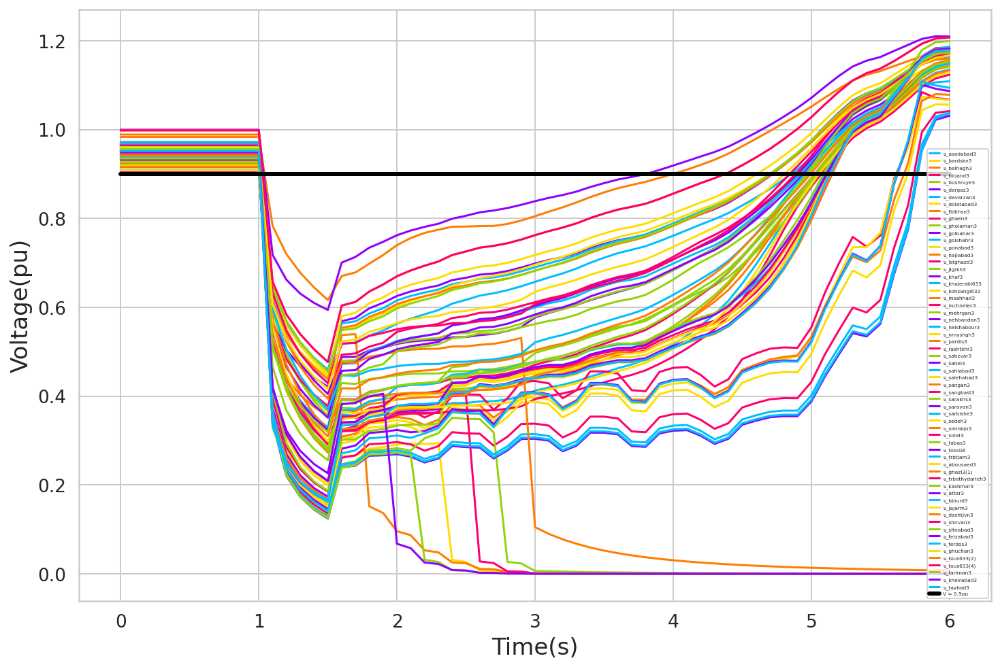

In [ ]:
plt.figure(figsize=(12,8))

for i in range(1, 123+61, 3):
    plt.plot(t[0:61], data[0:61,i], label=df.columns[i] )

'''
plt.annotate('(3.1, 0.9)', xy =(3.1, 0.9),
                xytext =(4, 0.6),  fontsize=15 ,
                arrowprops = dict(facecolor ='black',
                 shrink = 0.05))
'''
plt.plot(t[0:61], 0.9*np.ones((61)), c='black', label='V = 0.9pu', linewidth=3)
#plt.scatter(3.12, 0.9, c='black', s=75)
plt.xlabel('Time(s)', fontsize=17)
plt.ylabel('Voltage(pu)', fontsize=17)
plt.legend(fontsize=3.7)

## 9th Load shedding

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/dataset/final_sim_9.csv')
data = df.to_numpy()
t = data[:, 0]

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


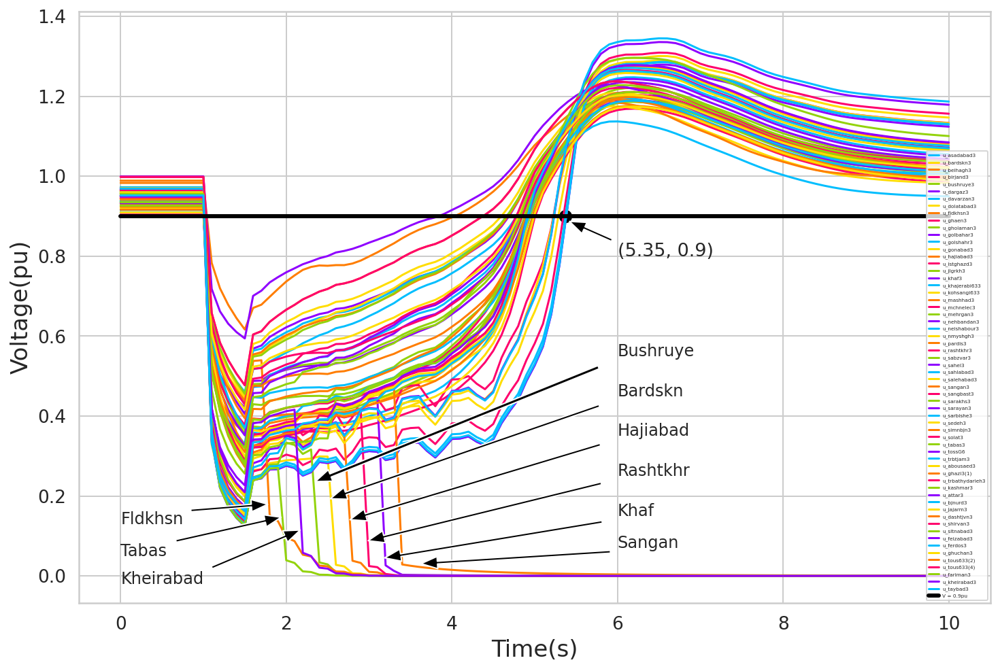

In [ ]:
plt.figure(figsize=(12,8))

for i in range(1, 123+61, 3):
    plt.plot(t[0:101], data[0:101,i], label=df.columns[i] )


plt.annotate('(5.35, 0.9)', xy =(5.39, 0.89),
                xytext =(6, 0.8),  fontsize=13.5 ,
                arrowprops = dict(facecolor ='black',width=2,headwidth=9,
                 shrink = 0.05))


plt.annotate('Fldkhsn', xy =(1.83, 0.18),
                xytext =(0, 0.13),  fontsize=12 ,
                arrowprops = dict(facecolor ='black',width=2,headwidth=9,
                 shrink = 0.05))

plt.annotate('Tabas', xy =(2.01, 0.15),
                xytext =(0, 0.05),  fontsize=12 ,
                arrowprops = dict(facecolor ='black',width=2,headwidth=9,
                 shrink = 0.05))


plt.annotate('Kheirabad', xy =(2.23, 0.12),
                xytext =(0, -0.02),  fontsize=12 ,
                arrowprops = dict(facecolor ='black',width=2,headwidth=9,
                 shrink = 0.05))

plt.annotate('Bushruye', xy =(2.16, 0.22),
                xytext =(6, 0.55),  fontsize=12 ,
                arrowprops = dict(facecolor ='black',width=2.5,headwidth=9,
                 shrink = 0.05))

plt.annotate('Bardskn', xy =(2.35, 0.18),
                xytext =(6, 0.45),  fontsize=12 ,
                arrowprops = dict(facecolor ='black',width=2,headwidth=9,
                 shrink = 0.05))

plt.annotate('Hajiabad', xy =(2.6, 0.13),
                xytext =(6, 0.35),  fontsize=12 ,
                arrowprops = dict(facecolor ='black',width=2,headwidth=9,
                 shrink = 0.05))

plt.annotate('Rashtkhr', xy =(2.83, 0.08),
                xytext =(6, 0.25),  fontsize=12 ,
                arrowprops = dict(facecolor ='black',width=2,headwidth=9,
                 shrink = 0.05))

plt.annotate('Khaf', xy =(3.04, 0.04),
                xytext =(6, 0.15),  fontsize=12 ,
                arrowprops = dict(facecolor ='black',width=2,headwidth=9,
                 shrink = 0.05))

plt.annotate('Sangan', xy =(3.58, 0.03),xycoords='data',
                xytext =(6, 0.07),textcoords='data',  fontsize=12,
                arrowprops = dict(facecolor ='black',width=2,headwidth=9,
                 shrink = 0.02))


plt.plot(t[0:101], 0.9*np.ones((101)), c='black', label='V = 0.9pu', linewidth=3)
plt.scatter(5.37, 0.9, c='black', s=75)
plt.xlabel('Time(s)', fontsize=17)
plt.ylabel('Voltage(pu)', fontsize=17)
plt.legend(fontsize=3.7)
plt.savefig('unstable_voltage2.eps', format='eps')

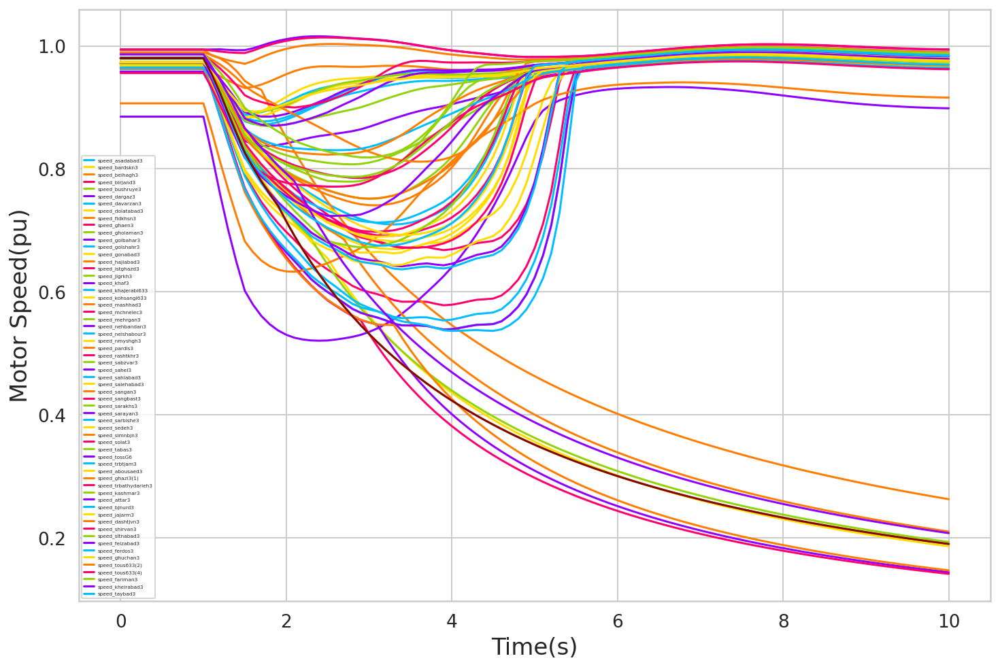

In [ ]:
plt.figure(figsize=(12,8))

for i in range(3, 123+61, 3):
    plt.plot(t[0:101], data[0:101,i], label=df.columns[i])


plt.xlabel('Time(s)', fontsize=17)
plt.ylabel('Motor Speed(pu)', fontsize=17)
plt.plot(t[0:101], data[0:101,123], c='darkred')
plt.legend(fontsize=3.7)
plt.savefig('unstable_speed2.png', format='png' ,dpi=1200)

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/dataset/final_sim_1.csv')
data1 = df.to_numpy()
t = data1[:, 0]

df = pd.read_csv('/content/drive/MyDrive/dataset/final_sim_9.csv')
data2 = df.to_numpy()

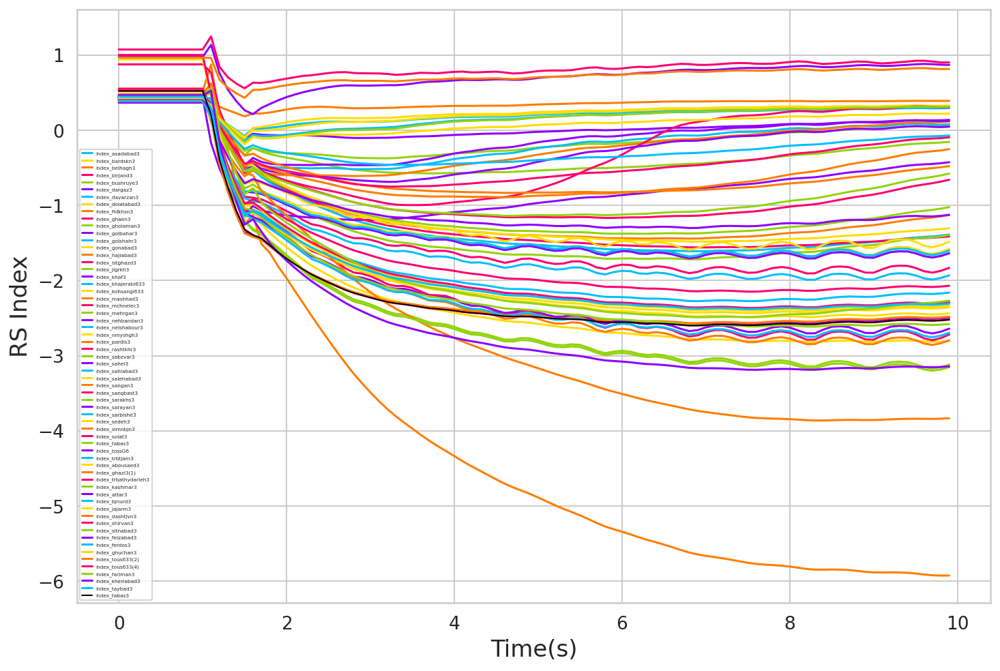

In [ ]:
plt.figure(figsize=(12,8))


for i in range(123+61, 123+61+61, 1):
    if i == 123+61+40+50:
        pass
    else:
        plt.plot(t[0:100], data1[0:100,i], label=df.columns[i])



plt.plot(t[0:100], data1[0:100, 123+61+27], label=df.columns[123+61+40], c='black',linewidth=1)
plt.xlabel('Time(s)', fontsize=17)
plt.ylabel('RS Index', fontsize=17)
plt.legend(fontsize=3.7)
#plt.savefig('unstable_index.svg', format='svg')

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


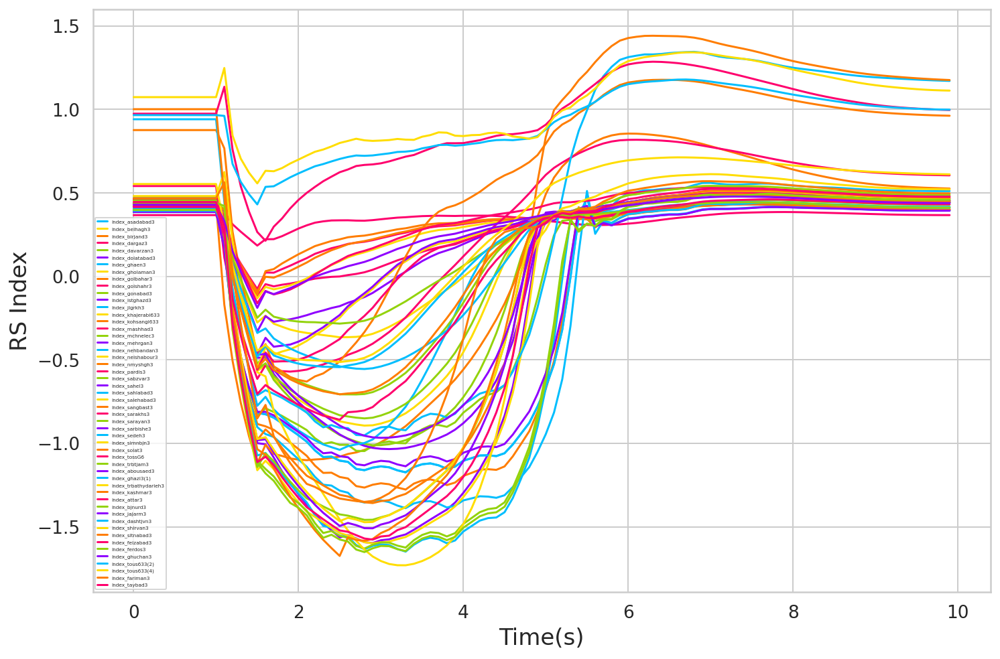

In [ ]:
plt.figure(figsize=(12,8))


for i in range(123+61, 123+61+61, 1):
    if i == 184+8:
        pass
    elif i == 184+8:
        pass
    elif i == 184+40:
        pass
    elif i == 184+59:
        pass
    elif i == 184+4:
        pass
    elif i == 184+1:
        pass
    elif i == 184+14:
        pass
    elif i == 184+27:
        pass
    elif i == 184+17:
        pass
    elif i == 184+32:
        pass
    else:
        plt.plot(t[0:100], data2[0:100,i], label=df.columns[i])



#plt.plot(t[0:100], data1[0:100, 123+61+27], label=df.columns[123+61+40], c='black',linewidth=1)
plt.xlabel('Time(s)', fontsize=17)
plt.ylabel('RS Index', fontsize=17)
plt.legend(fontsize=3.7)
plt.savefig('unstable_index2.eps', format='eps')

# stable

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/dataset/final_stable.csv')
data = df.to_numpy()
t = data[:, 0]

In [ ]:
Predictions = []
Rs_JAD = []

for i in range(123+61, 123+61+61, 1):

    Rs_i = data[:, i]
    Rs_JAD.append(Rs_i[17])
    tst_i = torch.tensor(Rs_i[0:18], dtype=torch.float32).reshape(1,18,1).to('cuda')

    preds_i = []
    with torch.no_grad():
    
        pred = network(tst_i)
        preds_i.append(pred.squeeze().item())
        #print(preds)

        for i in range(7):
            tst_i = torch.roll(tst_i, -1, 1)
            tst_i[0,17,0] = pred.squeeze().item()
            #print(tst)
            pred = network(tst_i)
            preds_i.append(pred.squeeze().item())
    
    Predictions.append(preds_i)
        

In [ ]:
Ri = []

for i in range (61):

    Ri.append(0.6*((Predictions[i][-1] - Rs_JAD[i])/0.8) + 0.4*Rs_JAD[i])
Ri = np.array(Ri)

In [ ]:
print(df.columns[123+61])
Predictions[40] = [-.47, -.56, -.65, -.71, -.75, -.79, -.82,  -.84]

index_asadabad3


In [ ]:
Load_shedding_bus = np.argmin(Ri)
print(df.columns[123+61+Load_shedding_bus])
Load_shedding_bus

index_tabas3


40

In [ ]:
Ri

array([ 0.03382093, -0.6666895 ,  0.21688847, -0.01763497, -0.83414732,
        0.21396249,  0.1783032 , -0.09772387,  0.24887645, -0.0627637 ,
        0.20285212,  0.35871997,  0.22754113,  0.24817314, -0.18231277,
        0.15063347,  0.19732493, -0.09760553,  0.22834453,  0.23088495,
        0.18888571,  0.22980824,  0.25419655,  0.0310998 ,  0.27892   ,
        0.25587535,  0.40171095, -0.17817943,  0.2229982 ,  0.25705511,
       -0.16779939,  0.18324405,  0.00941631,  0.45053673,  0.25305316,
       -0.36796319,  0.0734086 ,  0.51441052,  0.18521655,  0.5783974 ,
       -0.86479148,  0.35562086,  0.27633756, -0.02352755,  0.19877897,
       -0.01885061, -0.32923784,  0.26261041,  0.21075298,  0.16418106,
        0.25134453,  0.32299021,  0.24047957,  0.23095788, -0.45765469,
        0.23578595,  0.39740235,  0.40999716,  0.21172464, -0.11002291,
        0.12102783])

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


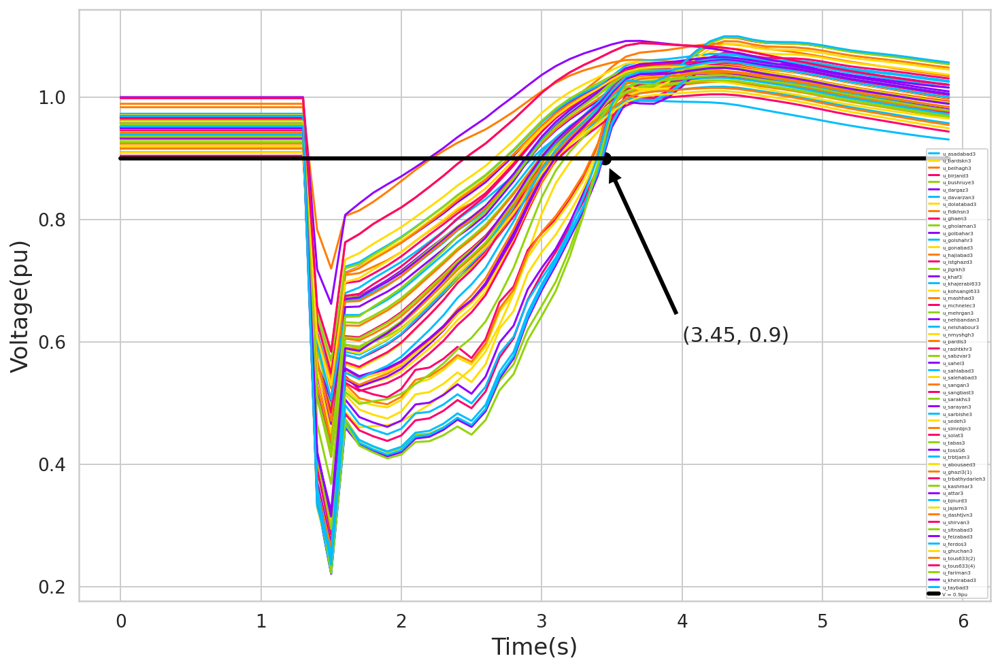

In [ ]:
plt.figure(figsize=(12,8))

for i in range(1, 123+61, 3):
    plt.plot(t[0:61], data[0:61,i], label=df.columns[i])


plt.annotate('(3.45, 0.9)', xy =(3.45, 0.9),
                xytext =(4, 0.6),  fontsize=15 ,
                arrowprops = dict(facecolor ='black',
                 shrink = 0.05))

plt.plot(t[0:61], 0.9*np.ones((60)), c='black', label='V = 0.9pu',  linewidth=3)
plt.scatter(3.45, 0.9, c='black', s=75)
plt.xlabel('Time(s)', fontsize=17)
plt.ylabel('Voltage(pu)', fontsize=17)
plt.legend(fontsize=3.7)
plt.savefig('stable_voltage.eps', format='eps')

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


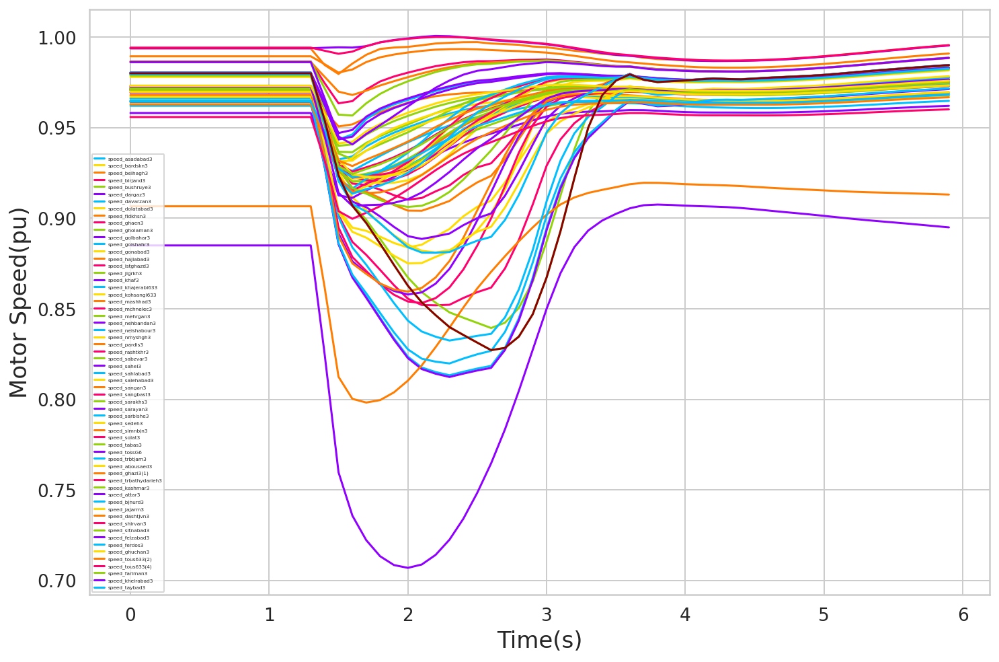

In [ ]:
plt.figure(figsize=(12,8))

for i in range(3, 123+61, 3):
    plt.plot(t[0:61], data[0:61,i], label=df.columns[i])


plt.xlabel('Time(s)', fontsize=17)
plt.ylabel('Motor Speed(pu)', fontsize=17)
plt.plot(t[0:61], data[0:61,123], c='darkred')
plt.legend(fontsize=3.7)
plt.savefig('stable_speed.eps', format='eps')

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/dataset/final_stable2.csv')
data = df.to_numpy()
t = data[:, 0]

In [ ]:
print(df.columns[121])

u_tabas3


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


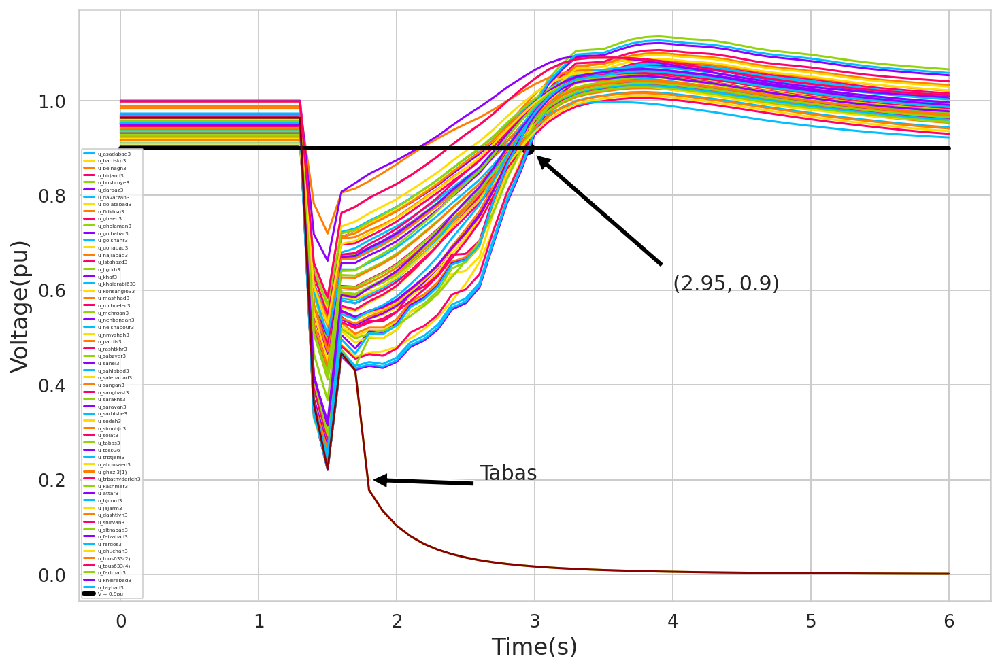

In [ ]:
plt.figure(figsize=(12,8))

for i in range(1, 123+61, 3):
    plt.plot(t[0:61], data[0:61,i], label=df.columns[i])


plt.annotate('(2.95, 0.9)', xy =(2.95, 0.9),
                xytext =(4, 0.6),  fontsize=15 ,
                arrowprops = dict(facecolor ='black',
                 shrink = 0.05))

plt.annotate('Tabas', xy =(1.8, 0.2),xycoords='data',
                xytext =(2.6, 0.2),textcoords='data',  fontsize=15,
                arrowprops = dict(facecolor ='black',
                 shrink = 0.02))


plt.plot(t[0:61], 0.9*np.ones((61)), c='black', label='V = 0.9pu', linewidth=3)
plt.scatter(2.95, 0.9, c='black', s=75)
plt.xlabel('Time(s)', fontsize=17)
plt.ylabel('Voltage(pu)', fontsize=17)
plt.plot(t[0:61], data[0:61,121], c='darkred')
plt.legend(fontsize=3.7)
plt.savefig('stable_voltage2.eps', format='eps')

In [ ]:
#plt.plot(t[0:61], data[0:61,121])
plt.plot(t[0:61], data[0:61,121])

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/dataset/final_stable2.csv')
data = df.to_numpy()
t = data[:, 0]

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


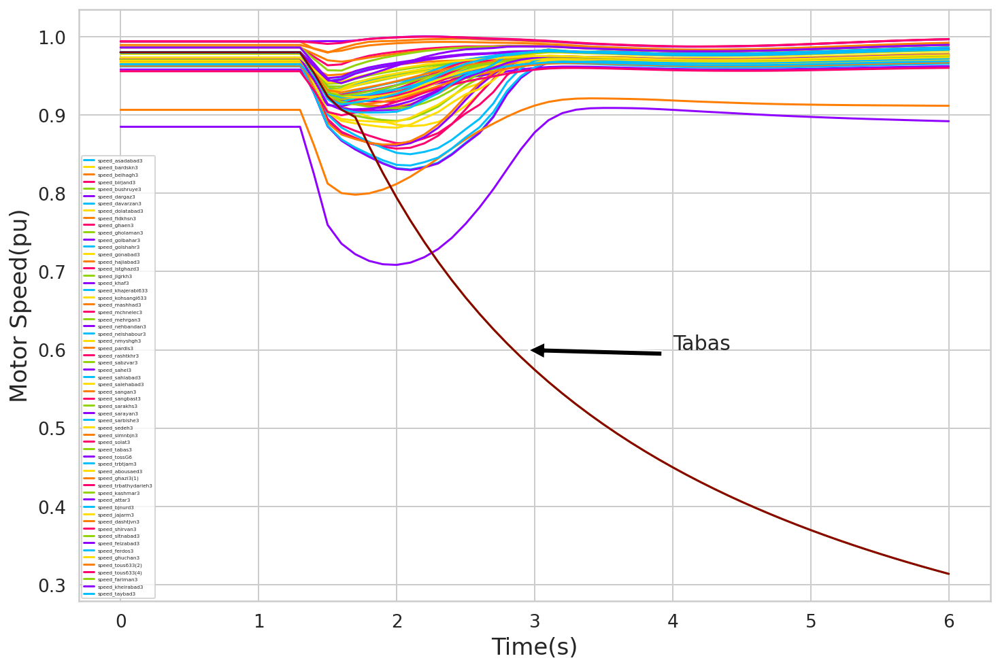

In [ ]:
plt.figure(figsize=(12,8))

for i in range(3, 123+61, 3):
    plt.plot(t[0:61], data[0:61,i], label=df.columns[i])


plt.annotate('Tabas', xy =(2.9, 0.6),
                xytext =(4, 0.6),  fontsize=15 ,
                arrowprops = dict(facecolor ='black',
                 shrink = 0.05))

plt.xlabel('Time(s)', fontsize=17)
plt.ylabel('Motor Speed(pu)', fontsize=17)
plt.plot(t[0:61], data[0:61,123], c='darkred')
plt.legend(fontsize=3.7)
plt.savefig('stable_speed2.eps', format='eps')

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


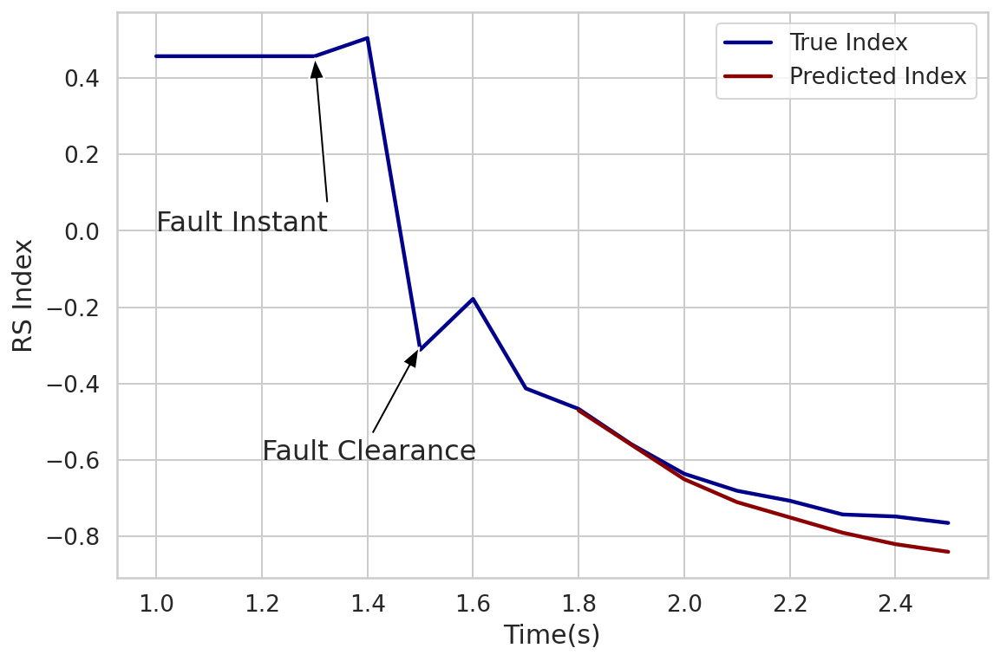

In [ ]:
plt.figure(figsize=(9,6))
plt.plot(t[10:26], data[10:26,123+61+Load_shedding_bus], c='darkblue', label = 'True Index',linewidth=2.2)
plt.plot(t[18:26], np.array(Predictions[40]), c='darkred', label = 'Predicted Index',linewidth=2.2)


plt.annotate('Fault Instant', xy =(1.3, 0.46),xycoords='data',
                xytext =(1, 0.0),textcoords='data',  fontsize=16,
                arrowprops = dict(facecolor ='black',width=2,headwidth=9,
                 shrink = 0.02))

plt.annotate('Fault Clearance', xy =(1.5, -0.3),xycoords='data',
                xytext =(1.2, -0.6),textcoords='data',  fontsize=16,
                arrowprops = dict(facecolor ='black',width=2,headwidth=9,
                 shrink = 0.02))


plt.xlabel('Time(s)', fontsize=15)
plt.ylabel('RS Index', fontsize=15)
plt.legend()
plt.savefig('Tabas_stable_index.eps', format='eps')

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/dataset/final_stable.csv')
data1 = df.to_numpy()

df = pd.read_csv('/content/drive/MyDrive/dataset/final_stable2.csv')
data2 = df.to_numpy()

t = data1[:, 0]

In [ ]:
data2[18:24,123+61+40]=[]

array([ 0.45705444,  0.45705444,  0.45705444,  0.45705444,  0.50454804,
       -0.31105403, -0.178165  , -0.41237893, -0.36666473, -0.45005767,
       -0.12525085, -0.44992898, -0.39049141,  1.49308937])

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


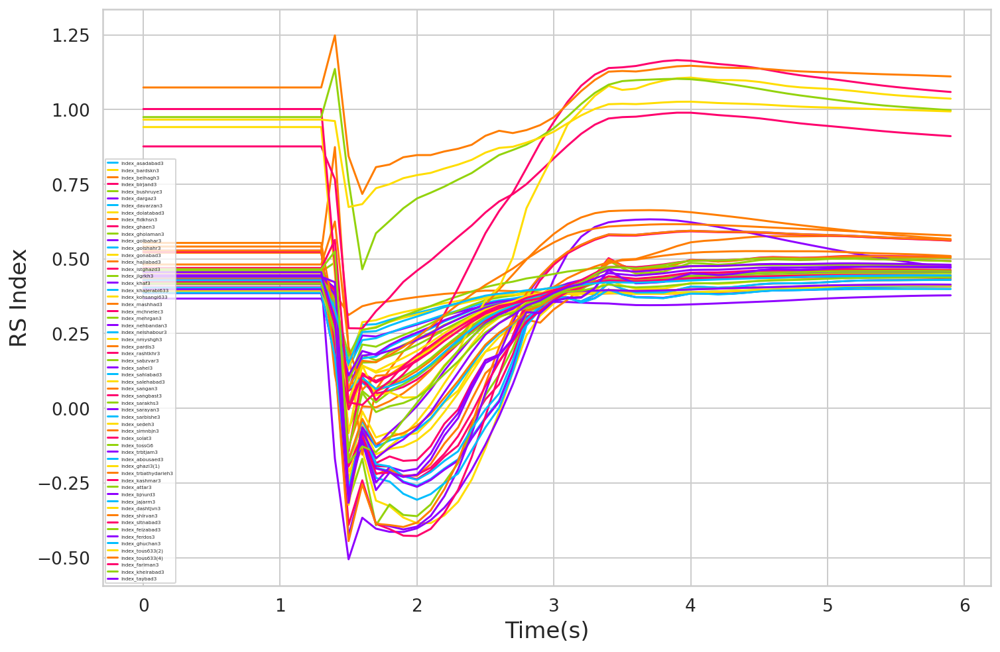

In [ ]:
plt.figure(figsize=(12,8))

for i in range(123+61, 123+61+61, 1):
    if i == 123+61+40:
        pass
    else:
        plt.plot(t[0:60], data2[0:60,i], label=df.columns[i])

'''
plt.annotate('Tabas', xy =(2.9, 0.6),
                xytext =(4, 0.6),  fontsize=15 ,
                arrowprops = dict(facecolor ='black',
                 shrink = 0.05))
'''

#plt.plot(t[0:18], data1[0:18, 123+61+40], label=df.columns[123+61+40], c='black', linewidth=3)

plt.xlabel('Time(s)', fontsize=17)
plt.ylabel('RS Index', fontsize=17)
plt.legend(fontsize=3.7)
plt.savefig('stable_index2.eps', format='eps')

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


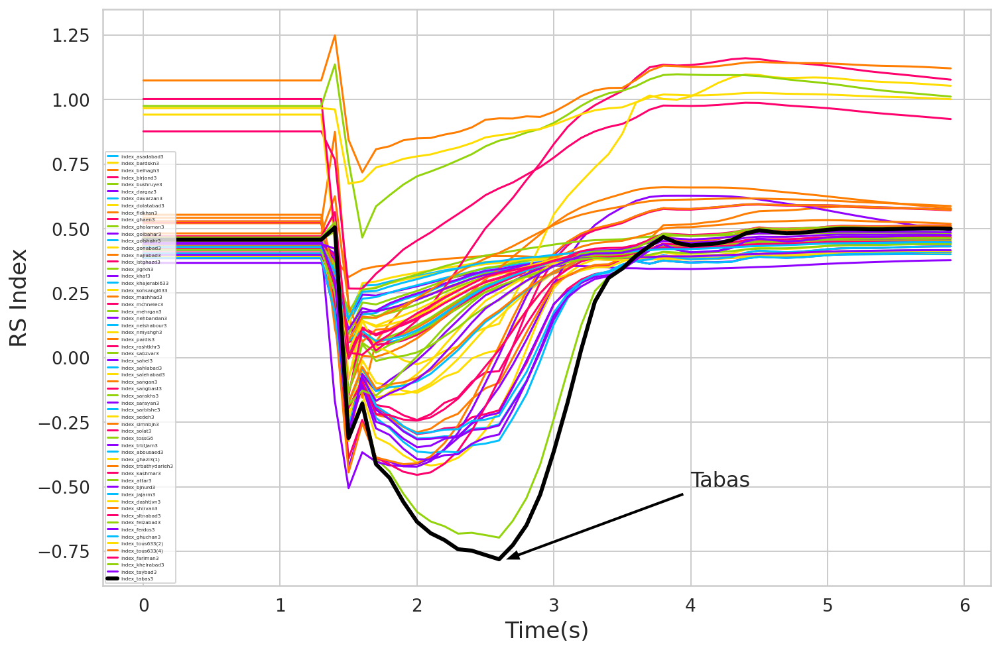

In [ ]:
plt.figure(figsize=(12,8))


for i in range(123+61, 123+61+61, 1):
    if i == 123+61+40:
        pass
    else:
        plt.plot(t[0:60], data1[0:60,i], label=df.columns[i])

plt.annotate('Tabas', xy =(2.61, -0.79),
                xytext =(4, -0.5),  fontsize=16,
                arrowprops = dict(facecolor ='black',width=3,headwidth=9,
                 shrink = 0.02))


plt.plot(t[0:60], data1[0:60, 123+61+40], label=df.columns[123+61+40], c='black',linewidth=3)
plt.xlabel('Time(s)', fontsize=17)
plt.ylabel('RS Index', fontsize=17)
plt.legend(fontsize=3.7)
plt.savefig('stable_index.eps', format='eps')